<a href="https://colab.research.google.com/github/MatthewMair42/migration/blob/main/MIMI_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data extraction on MIMI dataset

**Import libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import holoviews as hv
import statistics
from scipy.stats import kendalltau, pearsonr, spearmanr
import seaborn as sns
import matplotlib.patches as mpatches
import math

C:\Users\Diletta\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\Diletta\anaconda3\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
C:\Users\Diletta\anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


**Pandas display options**

In [ ]:
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)

### Download dataset

Retrieve dataset from Zenodo and read the CSV file:

In [ ]:
path = 'https://zenodo.org/record/6493325/files/mimi_dataset_v2.csv?download=1'

In [ ]:
mimi = pd.read_csv(path, index_col=[0], sep=",", low_memory=False)

Visualize a sample of records:

In [ ]:
mimi[2390:2400]

origin_country destination_country  ESTAT_2015_T_T_cit  \
from_to                                                          
BG-ES               BG                  ES              4921.0   
BG-ET               BG                  ET                 NaN   
BG-FI               BG                  FI               228.0   
BG-FJ               BG                  FJ                 NaN   
BG-FK               BG                  FK                 NaN   
BG-FM               BG                  FM                 NaN   
BG-FO               BG                  FO                 NaN   
BG-FR               BG                  FR              1909.0   
BG-GA               BG                  GA                 NaN   
BG-GB               BG                  GB                 NaN   

         ESTAT_2016_T_T_cit  ESTAT_2015_M_T_cit  ESTAT_2017_T_T_cit  \
from_to                                                               
BG-ES                5150.0              2456.0              6050.0   
BG-ET                   NaN                 NaN                 NaN   
BG-FI                 182.0               126.0               200.0   
BG-FJ                   NaN                 NaN                 NaN   
BG-FK                   NaN                 NaN                 NaN   
BG-FM                   NaN                 NaN                 NaN   
BG-FO                   NaN                 NaN                 NaN   
BG-FR                1625.0               932.0              1484.0   
BG-GA                   NaN                 NaN                 NaN   
BG-GB                7200.0                 NaN                 NaN   

         ESTAT_2018_T_T_cit  ESTAT_2019_T_T_cit  ESTAT_2014_T_T_cit  \
from_to                                                               
BG-ES                5363.0              5600.0              4699.0   
BG-ET                   NaN                 NaN                 NaN   
BG-FI                 269.0               182.0               251.0   
BG-FJ                   NaN                 NaN                 NaN   
BG-FK                   NaN                 NaN                 NaN   
BG-FM                   NaN                 NaN                 NaN   
BG-FO                   NaN                 NaN                 NaN   
BG-FR                1523.0              1847.0              1598.0   
BG-GA                   NaN                 NaN                 NaN   
BG-GB                   NaN                 NaN              9234.0   

         ESTAT_2013_T_T_cit  ESTAT_2008_T_T_cit  ESTAT_2019_T_15-64_cit  \
from_to                                                                   
BG-ES                4947.0             10771.0                  4394.0   
BG-ET                   NaN                 NaN                     NaN   
BG-FI                 272.0               166.0                   146.0   
BG-FJ                   NaN                 NaN                     NaN   
BG-FK                   NaN                 NaN                     NaN   
BG-FM                   NaN                 NaN                     NaN   
BG-FO                   NaN                 NaN                     NaN   
BG-FR                1923.0                 NaN                     NaN   
BG-GA                   NaN                 NaN                     NaN   
BG-GB                   NaN                 NaN                     NaN   

         ESTAT_2017_T_15-64_cit  ESTAT_2008_T_15-64_cit  ESTAT_2012_T_T_cit  \
from_to                                                                       
BG-ES                    4815.0                  8882.0              6224.0   
BG-ET                       NaN                     NaN                 NaN   
BG-FI                     165.0                   136.0               269.0   
BG-FJ                       NaN                     NaN                 NaN   
BG-FK                       NaN                     NaN                 NaN   
BG-FM                       NaN                     NaN

## 1. Social Connectedness Index

SCI column description:

In [ ]:
mimi.sci_2020.describe()

count    2.882100e+04
mean     1.123429e+05
std      4.043237e+06
min      2.850000e+01
25%      2.850000e+01
50%      4.680000e+02
75%      2.434000e+03
max      4.640564e+08
Name: sci_2020, dtype: float64

In [ ]:
mimi.sci_2021.describe()

count    2.882100e+04
mean     3.089129e+04
std      4.894305e+05
min      2.200000e+01
25%      2.200000e+01
50%      3.850000e+02
75%      2.071000e+03
max      3.180508e+07
Name: sci_2021, dtype: float64

### 1.1 SCI distribution

Text(0.5, 0.98, 'SCI distribution')

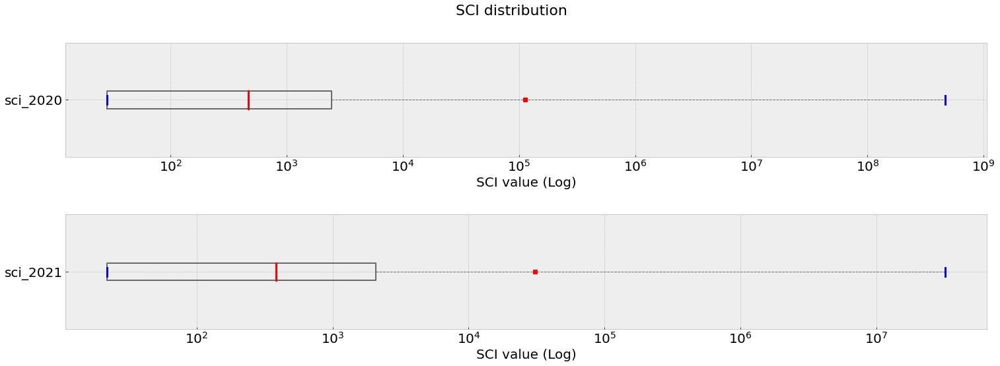

In [ ]:
matplotlib.style.use('bmh')
fig, ax = plt.subplots(2, 1, figsize=(25, 8))
fig.subplots_adjust(hspace=.5)

boxprops = dict(linestyle='-', linewidth=2, color='dimgray')
medianprops = dict(linestyle='-', linewidth=3, color='red')
whiskerprops = dict(linestyle='--', linewidth=1, color='dimgray')
capprops=dict(linestyle='-', linewidth=3, color='blue')
flierprops=dict(linestyle='-', color='none', markerfacecolor='none', markersize=7, markeredgecolor='darkgrey')
meanprops={"marker":"s","markerfacecolor":"red", "markeredgecolor":"red"}

for i in [0, 1]:
    mimi.boxplot(column=f'sci_202{str(i)}', vert=False, boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops,
             capprops=capprops, meanprops=meanprops, showmeans=True, whis=1000000, showfliers=True, grid=True, ax=ax[i])
    ax[i].set_xlabel('SCI value (Log)', fontsize=20)
    ax[i].set_xscale('symlog')
    ax[i].tick_params(axis='y', labelsize=20)
    ax[i].tick_params(axis='x', labelsize=20)
plt.suptitle('SCI distribution', fontsize=22)

Text(0, 0.5, 'SCI 2021')

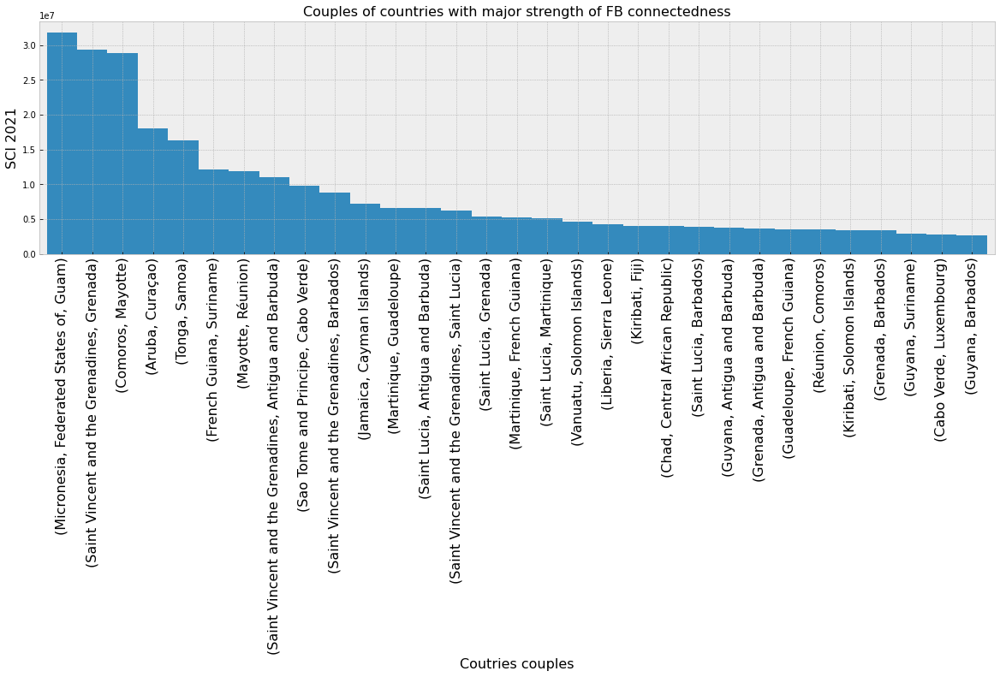

In [ ]:
plt.figure(figsize=(20, 5))

q = 0.998

mimi[mimi.sci_2021 > mimi.sci_2021.quantile(q)].drop_duplicates(subset='sci_2021', keep="first").sci_2021.groupby(
    [mimi.origin_name, mimi.destination_name]).agg('max').sort_values(ascending=False).plot(kind="bar", width=1.0)

plt.xticks(rotation=90, horizontalalignment="center", fontsize=16)
plt.title("Couples of countries with major strength of FB connectedness", fontsize=16)
plt.xlabel("Coutries couples", fontsize=16)
plt.ylabel("SCI 2021", fontsize=16)

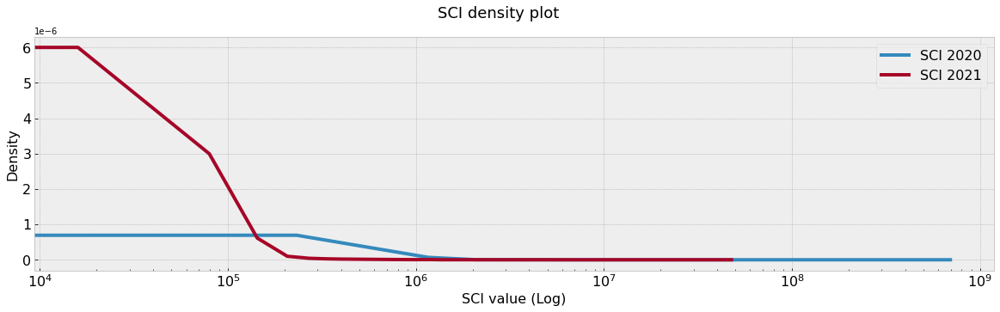

In [ ]:
for i in [0, 1]:
    mimi[f'sci_202{str(i)}'].plot.density(figsize=(20,5), fontsize=16, logx=True, linewidth=4, label=f'SCI 202{str(i)}')
plt.xlabel('SCI value (Log)', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.suptitle('SCI density plot', fontsize=18)
plt.legend(fontsize=16)

***

### 1.2 SCI correlations

- **Kendall’s tau-b** formulation is used to check ranking correspondence. Values close to the positive or to the negative bound indicate, respectively, strong agreement or disagreement of rankings.
- **Spearman rank-order** formulation is used to find non linear monotonicity between variables. Similar to Pearson's correlation, Spearman's varies in the range [-1, +1] with 0 implying no correlation.

In [ ]:
k_corr = mimi.corr(method='kendall')
s_corr = mimi.corr(method='spearman')

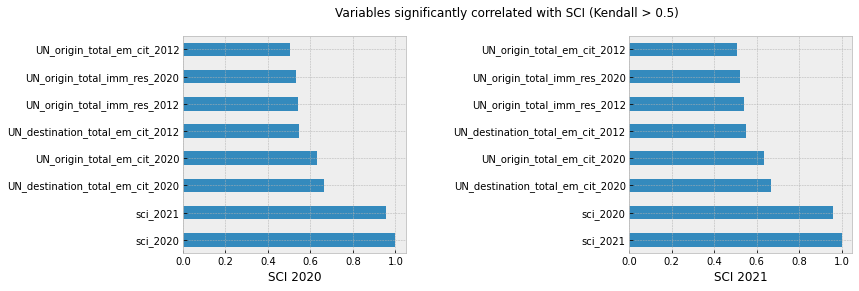

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
perc = 0.5
plt.suptitle(f'Variables significantly correlated with SCI (Kendall > {str(perc)})')
fig.subplots_adjust(wspace=1)
for i in [0, 1]:
    k_corr[k_corr[f'sci_202{str(i)}'] > perc][f'sci_202{str(i)}'].sort_values(ascending=False).plot(kind='barh', ax=ax[i])
    ax[i].set_xlabel(f'SCI 202{str(i)}')

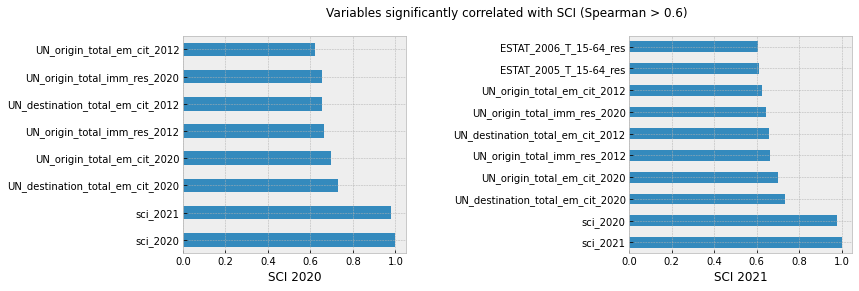

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
perc = 0.6
plt.suptitle(f'Variables significantly correlated with SCI (Spearman > {str(perc)})')
fig.subplots_adjust(wspace=1)
for i in [0, 1]:
    s_corr[s_corr[f'sci_202{str(i)}'] > perc][f'sci_202{str(i)}'].sort_values(ascending=False).plot(kind='barh', ax=ax[i])
    ax[i].set_xlabel(f'SCI 202{str(i)}')

***

### 1.3 FB strenght of connectedness among continents

Build pivot table:

In [ ]:
sci_table = pd.pivot_table(mimi, values='sci_2020', index=['origin_cont_code'], columns=['destination_cont_code'], aggfunc={'sci_2020': np.mean})
table_cont = pd.DataFrame(sci_table.unstack()).reset_index()
table_cont = table_cont.rename(columns={0:'sci'})
table_cont['sci'].fillna(0.1, inplace=True)
sci_table

destination_cont_code,AF,AN,AQ,AS,EU,OC,SA
origin_cont_code,,,,,,,
AF,428827.224979,3.252304e+03,NaN,4062.843832,7181.941026,1.039106e+03,1496.707317
AN,2526.559902,1.431437e+06,NaN,858.525743,3304.086243,2.019690e+03,103293.639053
AQ,NaN,NaN,NaN,NaN,28.500000,NaN,NaN
AS,4097.729520,1.099471e+03,NaN,55005.875697,2533.894325,2.514311e+03,361.910501
EU,8061.716465,4.034385e+03,28.5,2596.940232,375949.373655,1.565394e+03,2576.530207
OC,841.814815,1.054226e+03,NaN,1987.731959,1152.530718,1.081182e+06,376.204878
SA,1236.438111,1.014849e+05,NaN,354.226727,2143.850318,4.361562e+03,292179.814286


Holoviews Chord Plot:

In [ ]:
hv.extension("matplotlib")
hv.output(fig='png', size=250)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [ ]:
cmap='accent'

:Chord   [destination_cont_code,origin_cont_code]   (sci)
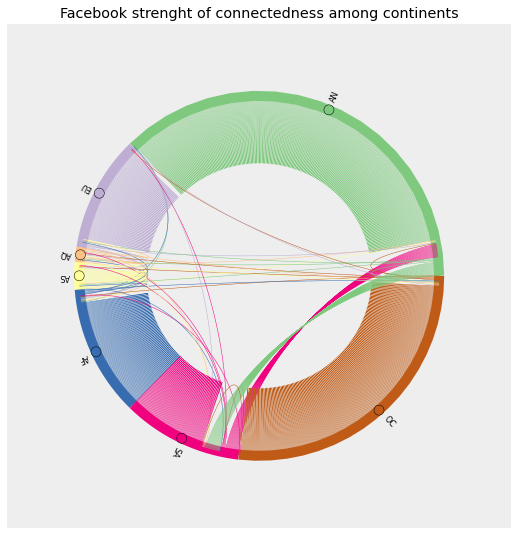

In [ ]:
%%opts Chord [labels="continent" title='Facebook strenght of connectedness among continents' ]
%%opts Chord (node_color="continent" node_cmap=cmap edge_color="origin_cont_code" edge_cmap=cmap)

countries = list(set(table_cont["origin_cont_code"].unique().tolist() + table_cont["destination_cont_code"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(countries, columns=["continent"]))

hv.Chord((table_cont, countries_chord))

The chord diagram displays Facebook strenght of connectedness among continents (averaged aggregation of SCI for each
couple of countries in the continent).

## 2. Migration flows

### 2.1. Chord diagrams

#### EUROSTAT migration flows

Choose an year between 2010 and 2019 and assign it to "y" variable.

In [ ]:
y = 2016 # substitute year

In [ ]:
def buildChord(df, val, idx, col):
    table = pd.pivot_table(df, values=val, index=[idx], columns=[col], aggfunc='sum')
    table = pd.DataFrame(table.unstack()).reset_index()
    table = table.rename(columns={0:'migr_flow_total_sum'})
    table['migr_flow_total_sum'].fillna(1, inplace=True)
    table.replace(0,1,inplace=True)
    return table

In [ ]:
eurostat_flows =  mimi[mimi[f'ESTAT_{str(y)}_T_T_res'] > 15000].sort_values(by=f'ESTAT_{str(y)}_T_T_res', ascending=False)
eurostat_chord = buildChord(eurostat_flows, f'ESTAT_{str(y)}_T_T_res', 'origin_name', 'destination_name')

:Chord   [destination_name,origin_name]   (migr_flow_total_sum)
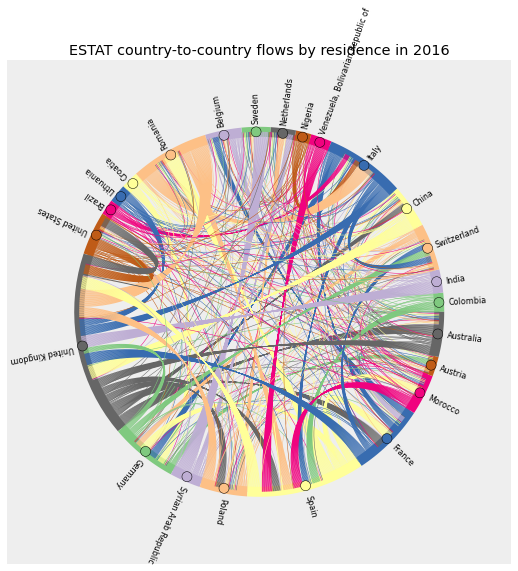

In [ ]:
%%opts Chord [labels="mig", title=f'ESTAT country-to-country flows by residence in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_name" edge_cmap=cmap)

c = list(set(eurostat_chord["origin_name"].unique().tolist() + eurostat_chord["destination_name"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c, columns=["mig"]))

hv.Chord((eurostat_chord, countries_chord))

The plot illustrates EUROSTAT bilateral migration flows by residence in the selected year : pairs of countries with the highest numbers of migrants sharing (over the treshold of 15,000).

***

In [ ]:
eurostat_continent_chord = buildChord(mimi, f'ESTAT_{str(y)}_T_T_res', 'origin_cont_code', 'destination_cont_code')

:Chord   [destination_cont_code,origin_cont_code]   (migr_flow_total_sum)
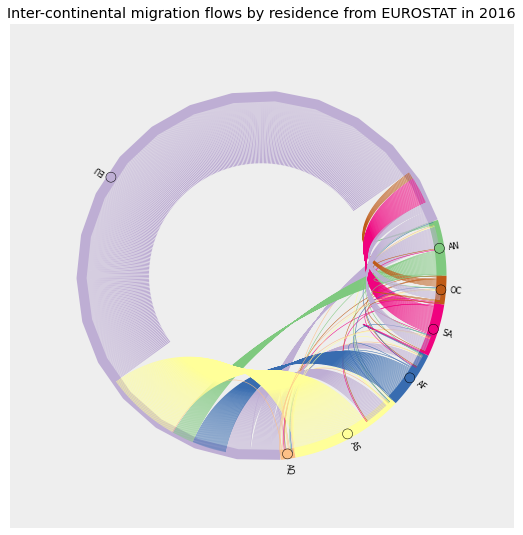

In [ ]:
%%opts Chord [labels="mig" title=f'Inter-continental migration flows by residence from EUROSTAT in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_cont_code" edge_cmap=cmap)

c = list(set(eurostat_continent_chord["origin_cont_code"].unique().tolist() +
                eurostat_continent_chord["destination_cont_code"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c, columns=["mig"]))

hv.Chord((eurostat_continent_chord, countries_chord))

The diagram illustrates bidirectional international mobility between pairs of continents (where values are aggregated as total sum of EUROSTAT migration flows by residence shared by pairs of countries in the given continent).

#### UN migration flows

Choose an year between 2010 and 2020 and assign it to "y" variable.

In [ ]:
y = 2016 # substitute year

In [ ]:
un_flows =  mimi[mimi[f'UN_{str(y)}_T_T_cit'] > 30000].sort_values(by=f'UN_{str(y)}_T_T_cit', ascending=False)
un_chord = buildChord(un_flows, f'UN_{str(y)}_T_T_cit', 'origin_name', 'destination_name')

:Chord   [destination_name,origin_name]   (migr_flow_total_sum)
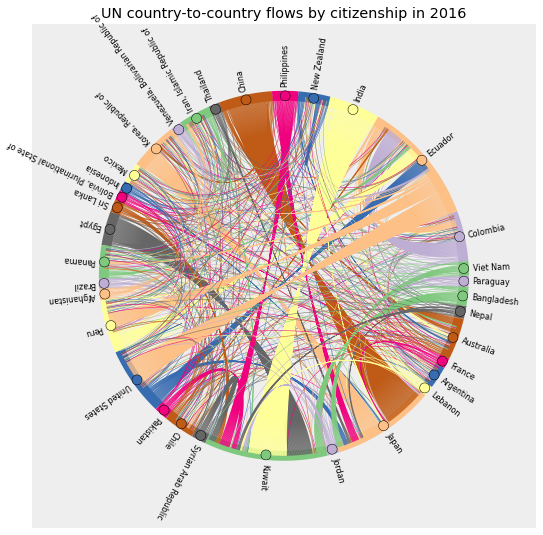

In [ ]:
%%opts Chord [labels="mig", title=f'UN country-to-country flows by citizenship in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_name" edge_cmap=cmap)

c = list(set(un_chord["origin_name"].unique().tolist() + un_chord["destination_name"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c, columns=["mig"]))

hv.Chord((un_chord, countries_chord))

The plot illustrates UN bilateral migration flows by citizenship in the selected year : pairs of countries with the highest numbers of migrants sharing (over the treshold of 30,000).

***

In [ ]:
un_continent_chord = buildChord(mimi, f'UN_{str(y)}_T_T_cit', 'origin_cont_code', 'destination_cont_code')

:Chord   [destination_cont_code,origin_cont_code]   (migr_flow_total_sum)
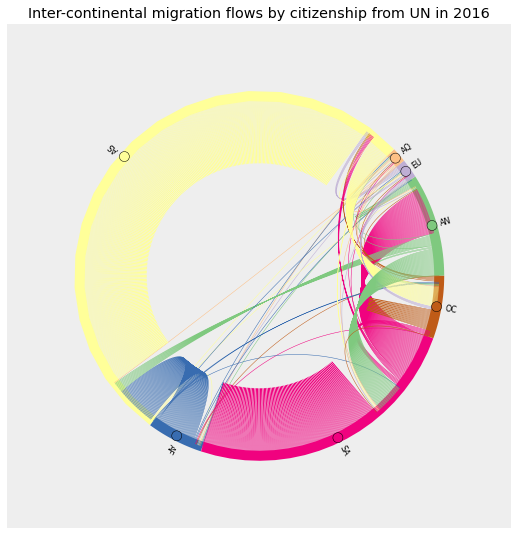

In [ ]:
%%opts Chord [labels="mig" title=f'Inter-continental migration flows by citizenship from UN in {str(y)}']
%%opts Chord (node_color="mig" node_cmap=cmap edge_color="origin_cont_code" edge_cmap=cmap)

c = list(set(un_continent_chord["origin_cont_code"].unique().tolist() +
                un_continent_chord["destination_cont_code"].unique().tolist()))
countries_chord = hv.Dataset(pd.DataFrame(c, columns=["mig"]))

hv.Chord((un_continent_chord, countries_chord))

The diagram illustrates bidirectional international mobility between pairs of continents (where values are aggregated as total sum of UN migration flows by citizenship shared by pairs of countries in the given continent).

### 2.2. Boxplots

In [ ]:
boxprops = dict(linestyle='-', linewidth=2, color='dimgray')
medianprops = dict(linestyle='-', linewidth=3, color='mediumvioletred')
whiskerprops = dict(linestyle='--', linewidth=1, color='dimgray')
capprops=dict(linestyle='-', linewidth=3, color='mediumvioletred')
flierprops=dict(linestyle='-', color='none', markerfacecolor='none', markersize=7, markeredgecolor='darkgrey')
meanprops={"marker":"s","markerfacecolor":"red", "markeredgecolor":"red"}

In [ ]:
boxprops_m = dict(linestyle='-', linewidth=2, color='dimgray')
medianprops_m = dict(linestyle='-', linewidth=3, color='steelblue')
whiskerprops_m = dict(linestyle='--', linewidth=1, color='dimgray')
capprops_m=dict(linestyle='-', linewidth=3, color='steelblue')

#### EUROSTAT migration flows

Text(0, 0.5, 'Number of migrants')

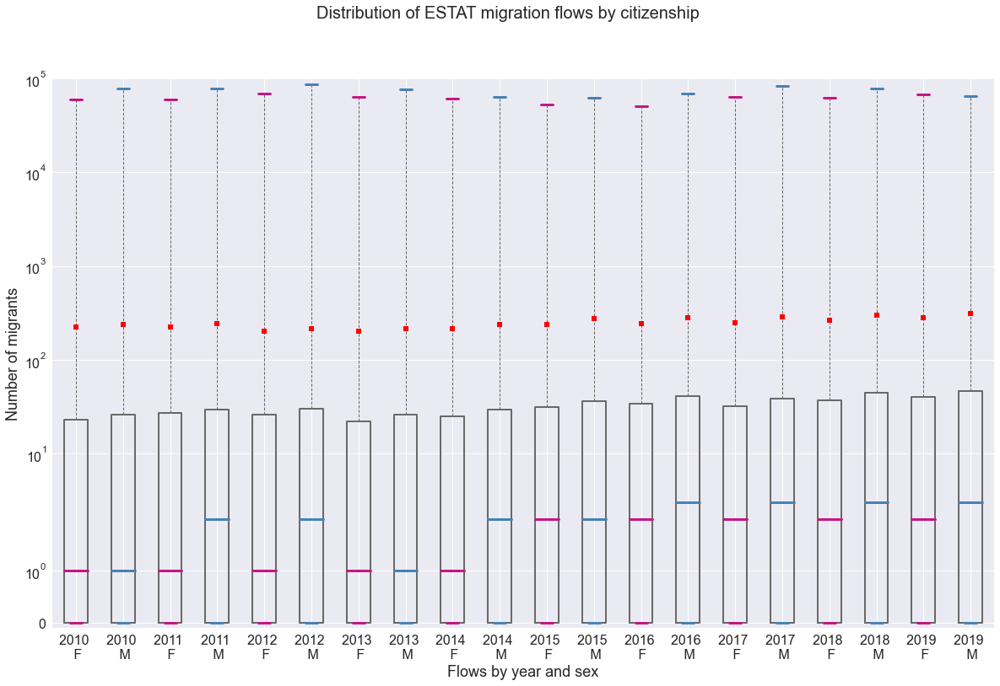

In [ ]:
matplotlib.style.use('seaborn')

col=[]
labels=[]
for i in range(2010,2020):
    for j in ['F', 'M']:
        col.append(f'ESTAT_{str(i)}_{(j)}_T_cit')
        labels.append(f'{str(i)} \n {(j)}')

female = mimi.boxplot(column=col[::2],positions=[p for p in range(1,21,2)],
            boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops,
            meanprops=meanprops, showmeans=True, showfliers=True, grid=True, whis=1000000, rot=0,figsize=(20,12))

plt.suptitle('Distribution of ESTAT migration flows by citizenship', fontsize=20)

male = mimi.boxplot(column=col[1::2],positions=[p for p in range(2,22,2)],
            boxprops=boxprops_m, flierprops=flierprops, medianprops=medianprops_m, whiskerprops=whiskerprops_m,
            capprops=capprops_m, meanprops=meanprops, showmeans=True, showfliers=True, whis=1000000, grid=True,figsize=(20,12))

plt.xticks(ticks=[x for x in range(1,21)], labels=labels, fontsize=16)
female.tick_params(axis='y', labelsize=16)
plt.yscale('symlog')
plt.ylim(-10*1e-2,10*1e4)
plt.xlabel('Flows by year and sex', fontsize=18)
plt.ylabel('Number of migrants', fontsize=18)

#### UN migration flows

Text(0, 0.5, 'Number of migrants')

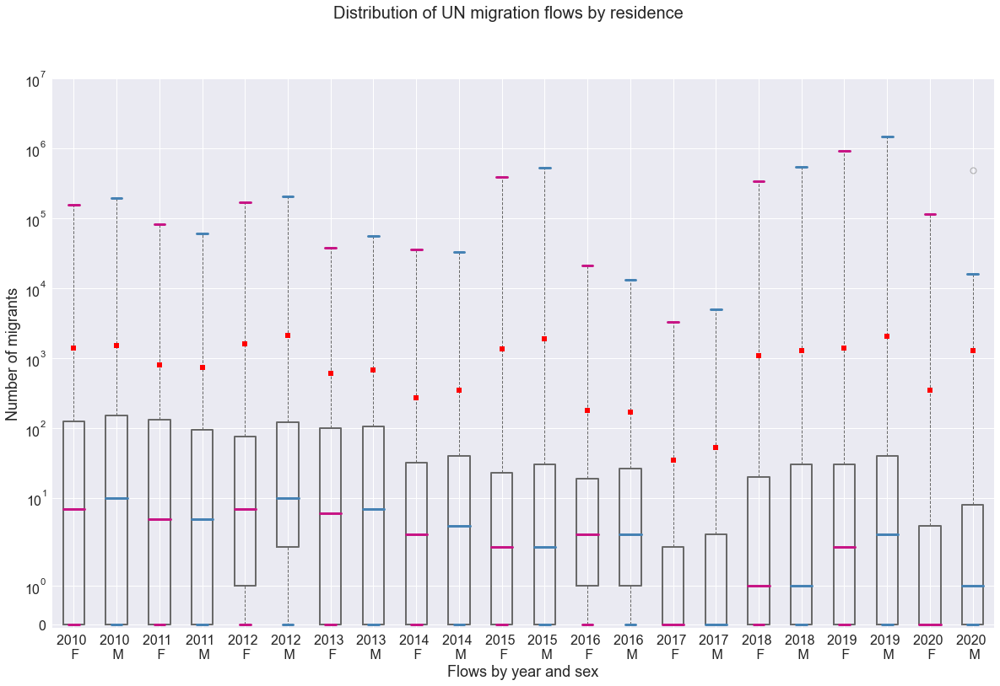

In [ ]:
matplotlib.style.use('seaborn')

col=[]
labels=[]
for i in range(2010,2021):
    for j in ['F', 'M']:
        col.append(f'UN_{str(i)}_{(j)}_T_res')
        labels.append(f'{str(i)} \n {(j)}')

female = mimi.boxplot(column=col[::2],positions=[p for p in range(1,22,2)],
            boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops,
            meanprops=meanprops, showmeans=True, showfliers=True, grid=True, whis=50000, rot=0,figsize=(20,12))

plt.suptitle('Distribution of UN migration flows by residence', fontsize=20)

male = mimi.boxplot(column=col[1::2],positions=[p for p in range(2,23,2)],
            boxprops=boxprops_m, flierprops=flierprops, medianprops=medianprops_m, whiskerprops=whiskerprops_m,
            capprops=capprops_m, meanprops=meanprops, showmeans=True, whis=50000, showfliers=True, grid=True,figsize=(20,12))

plt.xticks(ticks=[x for x in range(1,23)], labels=labels, fontsize=16)
female.tick_params(axis='y', labelsize=16)
plt.yscale('symlog')
plt.ylim(-10*1e-2,10*1e6)
plt.xlabel('Flows by year and sex', fontsize=18)
plt.ylabel('Number of migrants', fontsize=18)

## 3. Migration stocks

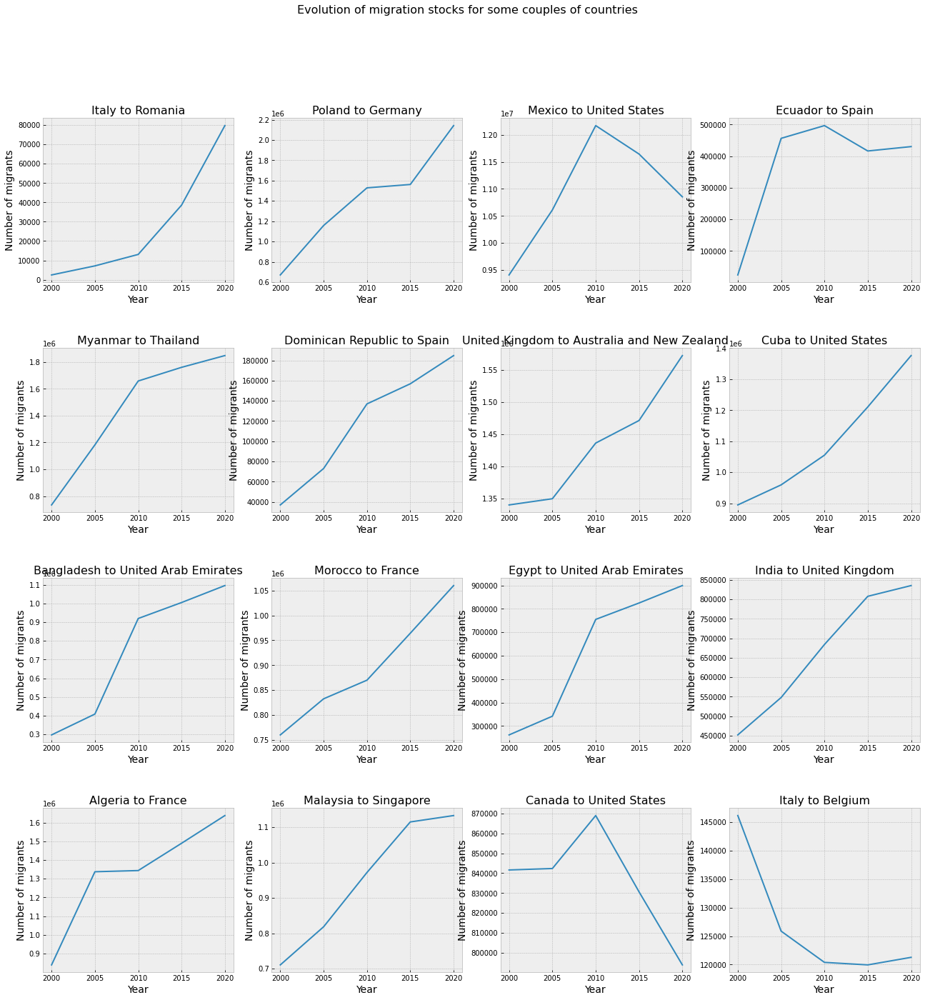

In [ ]:
sns.reset_orig()
matplotlib.style.use('bmh')
fig, ax = plt.subplots(4, 4, figsize=(22,22))
fig.subplots_adjust(wspace=.5)

couples=[['IT-RO', 'PL-DE', 'MX-US', 'EC-ES'],
         ['MM-TH', 'DO-ES', 'GB-QS', 'CU-US'],
         ['BD-AE', 'MA-FR', 'EG-AE', 'IN-GB'],
         ['DZ-FR', 'MY-SG', 'CA-US', 'IT-BE']]

years = range(2000,2025,5)

for i in range(len(couples)): # 4 rows
    list_=[]
    for j in range(len(couples)): # 4 cols
        temp = mimi[mimi.index==couples[i][j]]
        list_ = [temp[f'UN_migr_stocks_{str(years[v])}_T_T'] for v in range(len(years))]
        ax[i, j].plot(years, list_)
        ax[i, j].set_xlabel('Year', fontsize=14)
        ax[i, j].set_ylabel('Number of migrants', fontsize=14)
        ax[i, j].set_title(f'{temp.origin_name[0]} to {temp.destination_name[0]}', fontsize=16)

plt.suptitle('Evolution of migration stocks for some couples of countries', fontsize=16)
plt.subplots_adjust(wspace=0.2, hspace=0.4)

The plot displays the change in absolute number of migrant for stocks, for some couples of countries.

***

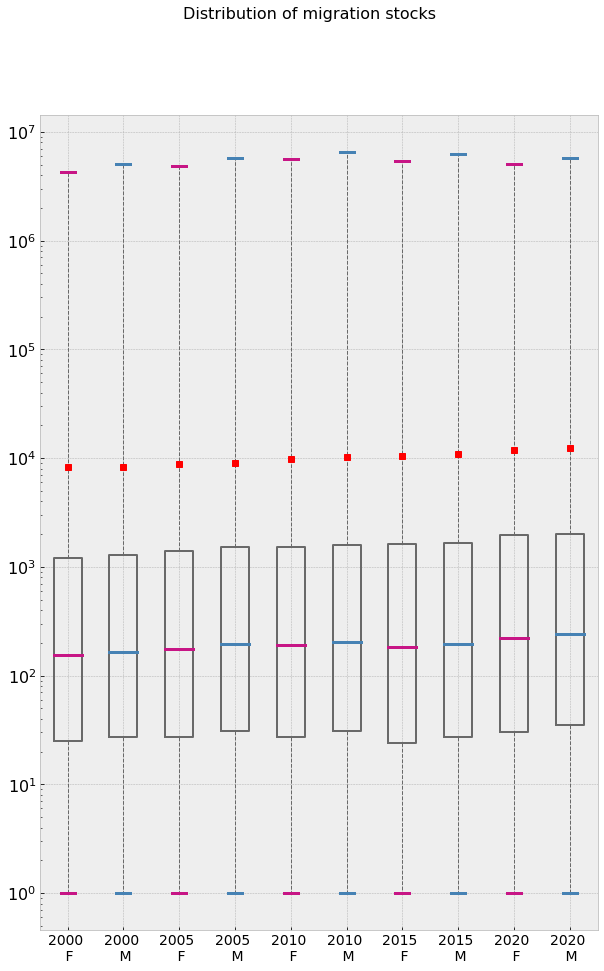

In [ ]:
col=[]
labels=[]
for i in range(2000,2025,5):
    for j in ['F', 'M']:
        col.append(f'UN_migr_stocks_{str(i)}_{(j)}_T')
        labels.append(f'{str(i)} \n {(j)}')

female = mimi.boxplot(column=col[::2],positions=[p for p in range(1,10,2)],
            boxprops=boxprops, flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops,
            capprops=capprops, meanprops=meanprops, showmeans=True, whis=50000, showfliers=True, grid=True, rot=0,figsize=(10,15))

male = mimi.boxplot(column=col[1::2],positions=[p for p in range(2,11,2)],
            boxprops=boxprops_m, flierprops=flierprops, medianprops=medianprops_m, whiskerprops=whiskerprops_m,
            capprops=capprops_m, meanprops=meanprops, showmeans=True, whis=50000, showfliers=True, grid=True, rot=0,figsize=(10,15))

plt.yscale('log')
plt.xticks(ticks=[x for x in range(1,11)], labels=labels, fontsize=14)
plt.suptitle('Distribution of migration stocks', fontsize=16)
female.tick_params(axis='y', labelsize=16)

## 4. Net migration rate

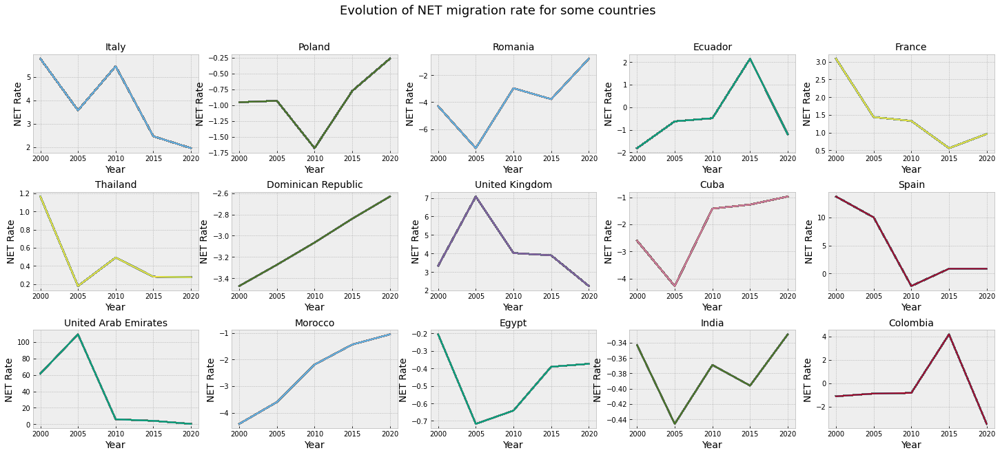

In [ ]:
fig, ax = plt.subplots(3, 5, figsize=(25,10))
fig.subplots_adjust(wspace=.5)

matplotlib.style.use('bmh')

country=[['IT', 'PL', 'RO', 'EC', 'FR'],
         ['TH', 'DO', 'GB', 'CU', 'ES'],
         ['AE', 'MA', 'EG', 'IN', 'CO']]

years = range(2000,2025,5)
for i in range(len(country)): # 3 rows
    list_=[]
    for j in range(5): # 5 cols
        temp = mimi[mimi.origin_country==country[i][j]]
        list_ = [temp[f'UN_origin_net_migr_rate_{str(years[v])}-{str(years[v]+5)}'] for v in range(len(years))]
        ax[i, j].plot(years, list_)
        ax[i, j].set_xlabel('Year', fontsize=14)
        ax[i, j].set_ylabel('NET Rate', fontsize=14)
        ax[i, j].set_title(f'{temp.origin_name[0]}', fontsize=14)
plt.suptitle('Evolution of NET migration rate for some countries', fontsize=18)
plt.subplots_adjust(wspace=0.2, hspace=0.4)

The plot displays the change of NET migration rate over time for some countries.

## 5. Percentage of facebook users

Text(0, 0.5, 'Percentage (users/population)')

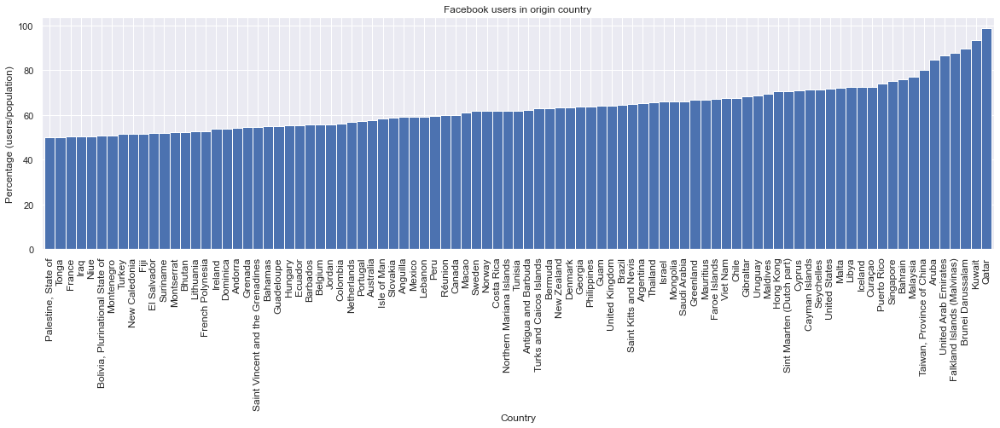

In [ ]:
plt.figure(figsize=(20, 5))
matplotlib.style.use('fivethirtyeight')
sns.set()

mimi[mimi.origin_fb_users_perc>50].origin_fb_users_perc.groupby([mimi.origin_name]).agg('max').sort_values().plot(kind="bar", width=1.0)

plt.xticks(rotation=90, horizontalalignment="center", fontsize=12)
plt.title("Facebook users in origin country")
plt.xlabel("Country")
plt.ylabel("Percentage (users/population)")

The barplot illustrates countries having more than 50% of facebook users over the total population.

## 6. Cultural Indicators

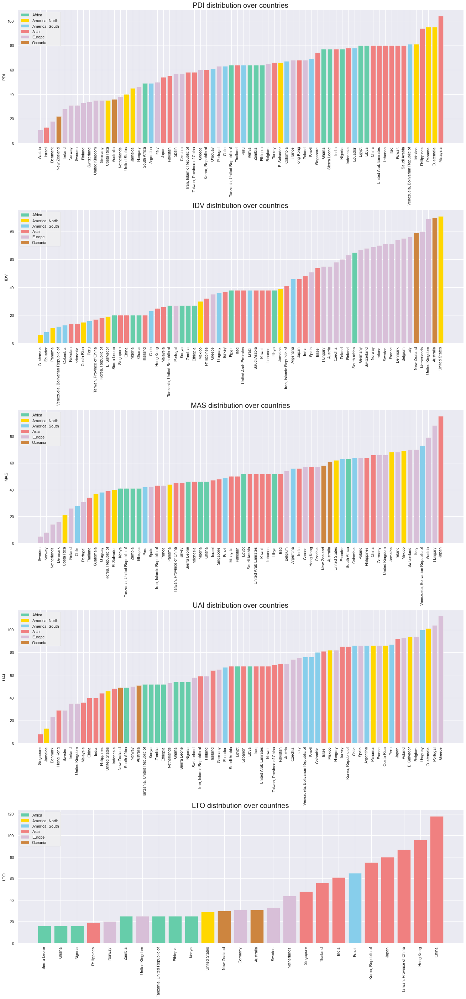

In [ ]:
sns.set()
fig, ax = plt.subplots(nrows=5, figsize=(20, 45))
matplotlib.style.use('fivethirtyeight')
fig.subplots_adjust(hspace=0.5)

cult_dist = ['PDI', 'IDV','MAS', 'UAI', 'LTO']

# color map
mimi['cont_num'] = mimi['destination_cont_code']
mimi['cont_num'] = mimi['cont_num'].replace(['AS', 'AQ', 'EU', 'SA', 'OC', 'AF', 'AN', math.nan],
                                            ['lightcoral', 'grey', 'thistle',  'skyblue', 'peru', 'mediumaquamarine', 'gold', 'gold'])

patch_7 = mpatches.Patch(color='mediumaquamarine', label='Africa')
patch_5 = mpatches.Patch(color='gold', label='America, North')
patch_4 = mpatches.Patch(color='skyblue', label='America, South')
patch_1 = mpatches.Patch(color='lightcoral', label='Asia')
patch_3 = mpatches.Patch(color='thistle', label='Europe')
patch_6 = mpatches.Patch(color='peru', label='Oceania')

for i in range(len(cult_dist)):

    df = mimi[mimi[f'destination_{str(cult_dist[i])}'].apply(abs) > 0]

    plotting_data = df[f'destination_{str(cult_dist[i])}'].groupby([df.destination_name, df.cont_num]).agg('mean').sort_values()
    plotting_data = plotting_data.to_frame()
    plotting_data = pd.DataFrame(plotting_data.to_records())

    ax[i].bar(plotting_data.destination_name, plotting_data[f'destination_{str(cult_dist[i])}'], color=plotting_data.cont_num)
    ax[i].set_title(f"{cult_dist[i]} distribution over countries")
    ax[i].set_xlabel("")
    ax[i].set_ylabel(cult_dist[i])

    ax[i].legend(handles=[patch_7, patch_5, patch_4, patch_1, patch_3, patch_6])
    for tick in ax[i].get_xticklabels():
        tick.set_rotation(90)

The barplots show the distribution of each cultural dimension over countries, divided by continent.

## 7. Correlations
P-values have been computed in order to confirm of refute the relevance of each correlation value: results are indicated with a number of asterisks proportional to the relevance obtained.

- no asterisks means low relevance: p-value > 0.05

- \* means medium relevance: p-value < 0.05

- \** means high relevance: p-value < 0.01

- \*** means very high relevance: p-value < 0.001

In [ ]:
def kendall_pval(x,y):
    return kendalltau(x,y)

def pearsonr_pval(x,y):
    return pearsonr(x,y)

def spearmanr_pval(x,y):
    return spearmanr(x,y)

In [ ]:
def computeCorr(c1, c2, method):
    columns = c1+c2
    corr = mimi[columns].corr(method=method)
    corr.drop(c2, inplace=True)
    corr = corr[c2]
    x_axis_labels = [item.replace("destination_", "") for item in c2]
    y_axis_labels = [item.replace("destination_", "") for item in c1]
    return corr, x_axis_labels, y_axis_labels

In [ ]:
def createCorrMatrix(col_i, col_j, method):
    matrix = [[0] * len(col_j) for x in range(len(col_i))]
    for i in range(len(col_i)):
        for j in range(len(col_j)):
            corr = mimi[col_i[i]].corr(mimi[col_j[j]], method = method)
            if corr is None:
                corr = (math.nan, 1)
            if (corr[1] < 0.05) & (corr[1] > 0.01):
                matrix[i][j] = str(round(corr[0], 3)) + ' *'
            if (corr[1] < 0.01) & (corr[1] > 0.001):
                matrix[i][j] = str(round(corr[0], 3)) + ' **'
            if (corr[1] < 0.001):
                matrix[i][j] = str(round(corr[0], 3)) + ' ***'
            else:
                matrix[i][j] = str(round(corr[0], 3)) # p-values > 0.05
    return matrix

In [ ]:
sns.set()

### 7.1. Pearson correlation between NET migration rate and GDP

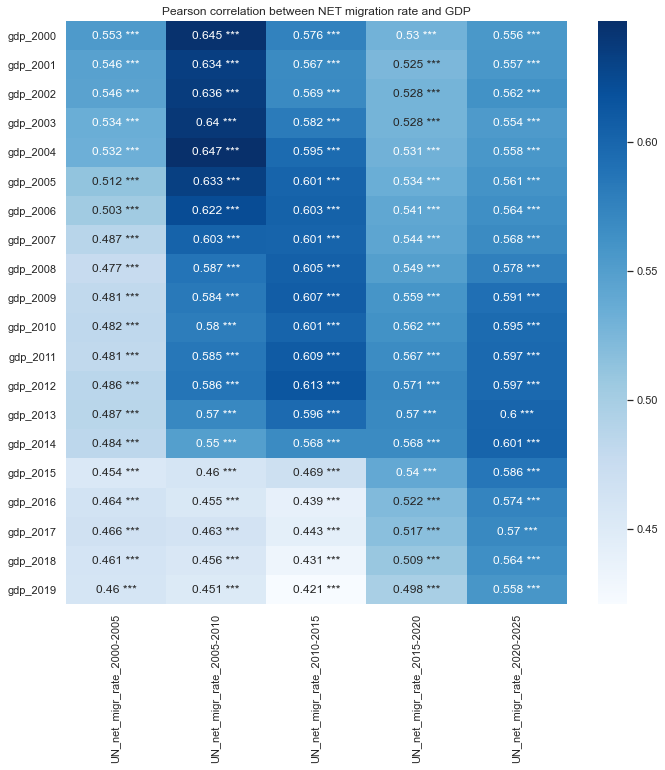

In [ ]:
rows=['UN_destination_net_migr_rate_2000-2005',
 'UN_destination_net_migr_rate_2005-2010',
 'UN_destination_net_migr_rate_2010-2015',
 'UN_destination_net_migr_rate_2015-2020',
 'UN_destination_net_migr_rate_2020-2025']

cols=[]
for i in range(2000, 2020):
    cols.append(f'destination_gdp_{str(i)}')

gdp_corr, x_axis_labels, y_axis_labels = computeCorr(cols, rows, 'pearson')
matr_GDP = createCorrMatrix(cols, rows, pearsonr_pval)

plt.figure(figsize=(10,10))
sns.heatmap(gdp_corr, cmap="Blues", annot=matr_GDP, fmt='', xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.title('Pearson correlation between NET migration rate and GDP')
plt.show()

### 7.2. Spearman correlation between EUROSTAT flows by citizenship and stocks

Select desired value for "sex" variable ('T', 'F' or 'M') to plot correlations related to, respectively, total, female and male flows by citizenship and stocks.

In [ ]:
sex = 'T' # substitute value

In [ ]:
stock = []
for j in range(2000,2025,5):
    stock.append(f'UN_migr_stocks_{str(j)}_{str(sex)}_T')

flow=[]
for i in range(2010,2020):
    flow.append(f'ESTAT_{str(i)}_{str(sex)}_T_cit')

In [ ]:
ESTAT_flow_stock_corr, x_axis_labels, y_axis_labels = computeCorr(stock, flow, 'spearman')
matr_ESTAT_flow_stock_corr = createCorrMatrix(stock, flow, spearmanr_pval)

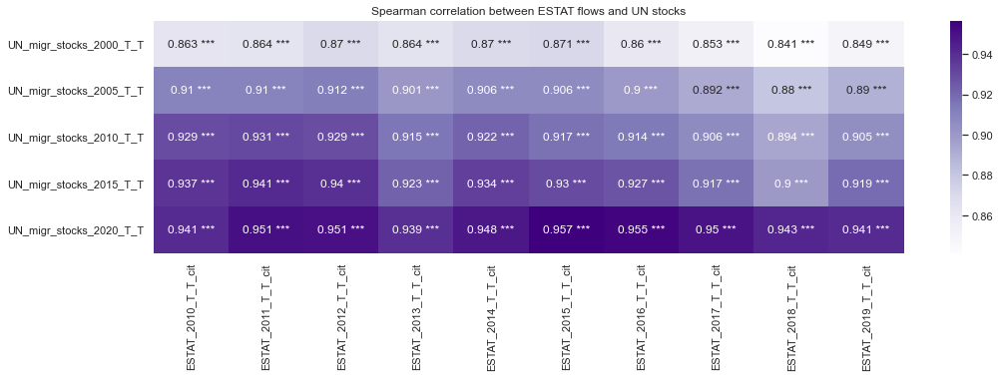

In [ ]:
plt.figure(figsize=(15,4))
sns.heatmap(ESTAT_flow_stock_corr, cmap="Purples", annot=matr_ESTAT_flow_stock_corr, fmt='')
plt.title('Spearman correlation between ESTAT flows and UN stocks')
plt.show()

### 7.3. Pearson correlation between UN and EUROSTAT yearly population measurements

In [ ]:
pop1=[]
pop2=[]
for i in range(2010,2022):
    pop1.append(f'UN_destination_pop_{str(i)}')
    pop2.append(f'ESTAT_destination_pop_{str(i)}')

In [ ]:
pop_corr, x_axis_labels, y_axis_labels = computeCorr(pop1, pop2, 'pearson')
matr_pop = createCorrMatrix(pop1, pop2, pearsonr_pval)

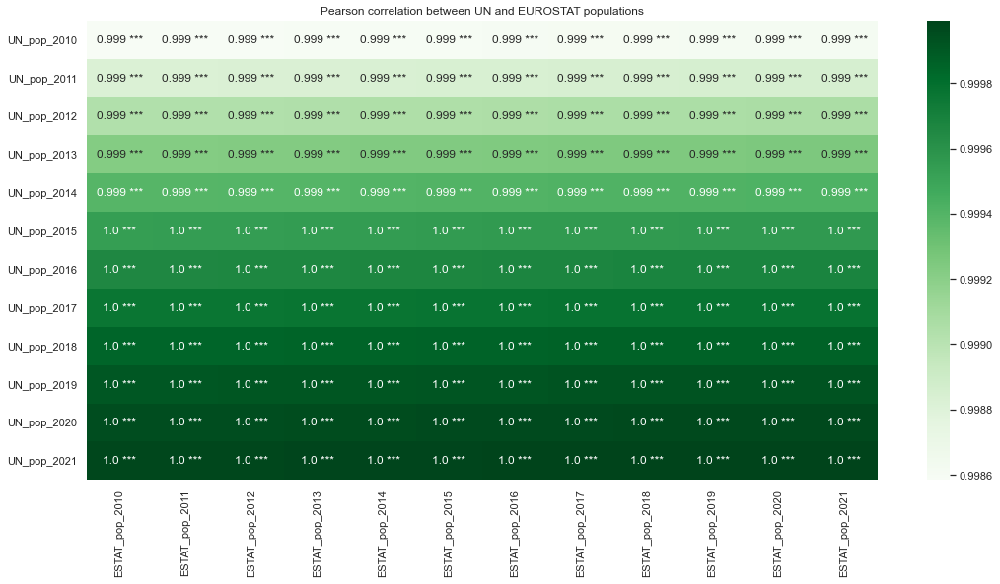

In [ ]:
plt.figure(figsize=(16,8))
sns.heatmap(pop_corr, cmap="Greens", annot=matr_pop, fmt='', xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.title('Pearson correlation between UN and EUROSTAT populations')
plt.show()

The two sources refer to different methodologies, since the annual total population measurement is performed on July 1st by UN, while on January 1st by EUROSTAT. However, their  correlation value of $\sim$1 proves that the two measures, related to the same year, are well compatible and almost interchangeable: indeed missing values related to the former have been replaced with the latter, and vice versa.